In [1]:
import pandas as pd 
import sklearn
import scipy
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np

In [2]:
sns.set_style("whitegrid")

In [3]:
df = pd.read_csv('owid_mobility_europe_data_long.csv')

In [4]:
country_list = ["Austria",'Belgium','Croatia','Cyprus','Czechia',
                 'Denmark','Estonia','Finland','France',
                 'Germany','Greece','Hungary','Iceland',
                 'Ireland','Italy','Latvia','Lithuania','Luxembourg',
                 'Malta', 'Netherlands','Norway','Poland','Portugal','Romania','Slovakia',
                 'Slovenia','Spain','Sweden']
europe_df = df[df['location'].isin(country_list)]
europe_df = europe_df.set_index("date")

In [16]:
def lag_corr_icu(df, country_name):
    max_lag = 30
    for variable in ["new_cases_per_million", 
                     "positive_rate", 
                     "driving",
                     "transit"]: #, ## change to keelan's R
                     # "reproduction_rate"]:
        lag_corr = []
        lag = []
        for k in range(-max_lag,max_lag+1):
            lag_df = df.shift(k)
            lag_corr.append(df[variable].corr(lag_df["icu_patients_per_million"]))
            lag.append(k)
        plt.figure()
        plt.plot(lag, lag_corr)    
        plt.xlim(-max_lag,max_lag)
        plt.ylabel("Correlation")
        plt.xlabel("Lag (days)")
        if variable == "new_cases_per_million":
            plt.title("{}: New Cases (per million)".format(country_name))
        elif variable == "positive_rate":
            plt.title("{}: Positive Rate".format(country_name))
        elif variable == "transit":
            plt.title("{}: Transit Mobility".format(country_name))
        elif variable == "driving":
            plt.title("{}: Driving Mobility".format(country_name))
        elif variable == "reproduction_number":
            plt.title("{}: Reproduction Number".format(country_name))
        plt.savefig("{}_icu_{}".format(country_name,variable))

/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


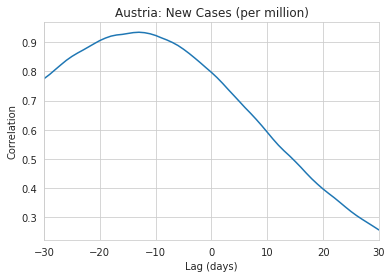

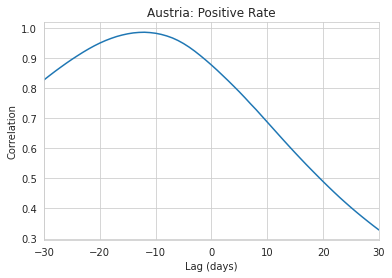

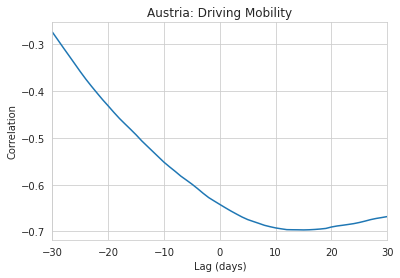

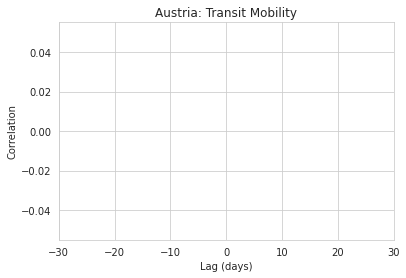

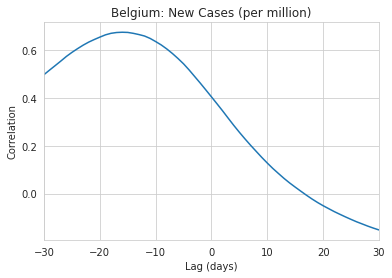

...

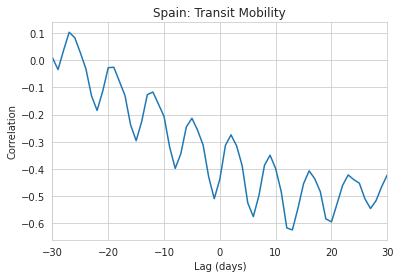

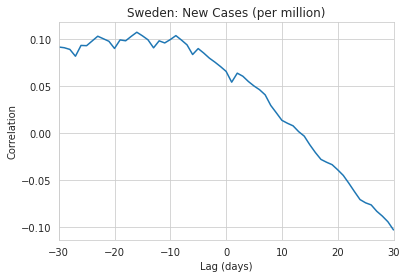

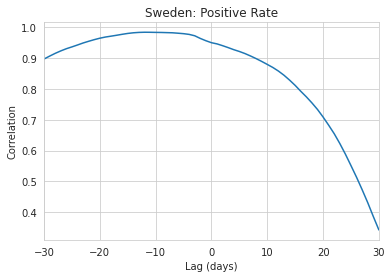

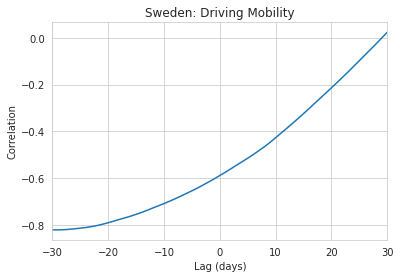

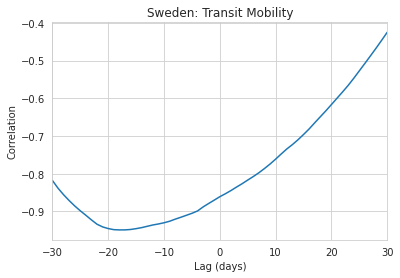

In [22]:
for country in country_list:
    country_df = europe_df[europe_df["location"] == country]

    lag_corr_icu(country_df, country)

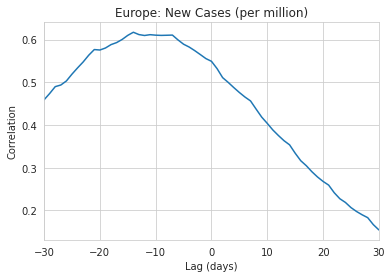

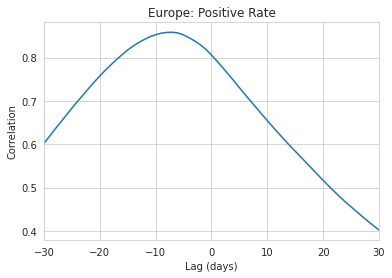

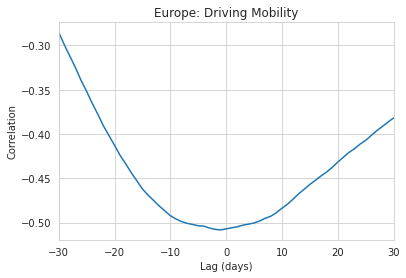

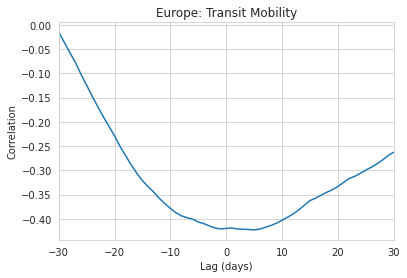

In [21]:
lag_corr_icu(europe_df, "Europe")

In [5]:
response_df = pd.read_csv('2_ecdc/country_response_measures.csv')

In [13]:
response_df = response_df[response_df['Country'].isin(country_list)]
lockdown_df = response_df.set_index("date_start")

start_df = response_df.drop(["date_end"], axis=1)
start_df = start_df.dropna(axis=0)
#start_df = start_df.set_index("date_start")


end_df = response_df.drop(["date_start"], axis=1)
end_df = end_df.dropna(axis=0)
#end_df = end_df.set_index("date_end")
start_df.Response_measure.unique()

array(['AdaptationOfWorkplace', 'BanOnAllEvents', 'ClosDaycare',
       'ClosDaycarePartial', 'ClosHigh', 'ClosPrim', 'ClosPrimPartial',
       'ClosPubAny', 'ClosPubAnyPartial', 'ClosSec', 'ClosSecPartial',
       'EntertainmentVenues', 'GymsSportsCentres',
       'HotelsOtherAccommodation', 'IndoorOver100', 'IndoorOver1000',
       'MasksMandatoryAllSpaces', 'MasksMandatoryClosedSpaces',
       'MasksMandatoryClosedSpacesPartial',
       'MasksVoluntaryClosedSpacesPartial', 'MassGather50',
       'MassGatherAll', 'NonEssentialShops', 'NonEssentialShopsPartial',
       'OutdoorOver1000', 'OutdoorOver50', 'OutdoorOver500',
       'PlaceOfWorship', 'PlaceOfWorshipPartial',
       'PrivateGatheringRestrictions', 'RestaurantsCafes', 'SocialCircle',
       'StayHomeGen', 'StayHomeOrder', 'StayHomeOrderPartial',
       'Teleworking', 'EntertainmentVenuesPartial',
       'GymsSportsCentresPartial', 'IndoorOver500',
       'MasksVoluntaryAllSpaces', 'MasksVoluntaryAllSpacesPartial',
       'R

In [60]:
def plot_driving_transit(country_df):
    for mode in ["driving", "transit"]:
        for stat in ["positive_rate", 
                     "new_deaths_per_million",
                     "new_cases_per_million",
                     "stringency_index",
                    "reproduction_rate"]:
            fig, ax1 = plt.subplots()
            ax2 = ax1.twinx()
            sns.lineplot(x="date", y=stat, data=country_df, ax=ax2, alpha=.5)
            sns.lineplot(x="date", y=mode, data=country_df, ax=ax1)
            if mode == "driving":
                ax1.set(xlabel='Date', ylabel='Driving Mobility')          
            else:
                ax1.set(xlabel='Date', ylabel='Transit Mobility')
            if stat == "positive_rate":
                ax2.set( ylabel='Positive Rate') 
            elif stat == "new_deaths_per_million":
                ax2.set( ylabel='Deaths per Million') 
            elif stat == "new_cases_per_million":
                ax2.set( ylabel='Cases per million')
            elif stat == "stringency_index":
                ax2.set( ylabel='Stringency')
            else:
                ax2.set(ylabel="Reproduction Number")
            plt.setp(ax1.get_xticklabels(), rotation=45)
            ax1.set_xticks(["2020-04-01",
                            "2020-05-01",
                            "2020-06-01",
                            "2020-07-01",
                            "2020-08-01",
                            "2020-09-01",
                            "2020-10-01",
                            "2020-11-01",
                            "2020-12-01",
                            "2021-01-01"])
            fig.tight_layout()

In [61]:
# def plot_driving_transit_end(country_df, country):
#     for mode in ["driving", "transit"]:
#         for stat in ["positive_rate", 
#                      "new_deaths_per_million",
#                      "new_cases_per_million",
#                      "stringency_index",
#                     "reproduction_rate"]:
#             fig, ax1 = plt.subplots()
#             ax2 = ax1.twinx()
#             sns.lineplot(x="date", y=stat, data=country_df, ax=ax2, alpha=.5)
#             sns.lineplot(x="date", y=mode, data=country_df, ax=ax1)
#             if mode == "driving":
#                 ax1.set(xlabel='Date', ylabel='Driving Mobility')          
#             else:
#                 ax1.set(xlabel='Date', ylabel='Transit Mobility')
#             if stat == "positive_rate":
#                 ax2.set( ylabel='Positive Rate') 
#             elif stat == "new_deaths_per_million":
#                 ax2.set( ylabel='Deaths per Million') 
#             elif stat == "new_cases_per_million":
#                 ax2.set( ylabel='Cases per million')
#             elif stat == "stringency_index":
#                 ax2.set( ylabel='Stringency')
#             else:
#                 ax2.set(ylabel="Reproduction Number")
#             plt.setp(ax1.get_xticklabels(), rotation=45)
#             ax1.set_xticks(["2020-04-01",
#                             "2020-05-01",
#                             "2020-06-01",
#                             "2020-07-01",
#                             "2020-08-01",
#                             "2020-09-01",
#                             "2020-10-01",
#                             "2020-11-01",
#                             "2020-12-01",
#                             "2021-01-01"])
#             fig.tight_layout()
               
#             end_country_df = end_df[end_df["Country"] == country].copy()
#             dates = end_country_df.date_end.unique()
#             end_country_df = end_country_df.set_index("date_end")
#             for date in dates:
#                 label = end_country_df["Response_measure"][date]
#                 plt.axvline(date)
#                 plt.text(date,0,str(label),rotation=90)
            #plt.savefig("end_{}_{}.png".format(mode,stat),bbox_inches='tight' )

In [10]:
def plot_driving_transit_response(country_df, country, response):
    for mode in ["driving", "transit"]:
        for stat in ["positive_rate", 
                     "new_deaths_per_million",
                     "new_cases_per_million",
                     "stringency_index",
                     "reproduction_rate"]:
            ylim = max(country_df[stat])
            if np.isnan(ylim) == False:
                fig, ax1 = plt.subplots()
                ax2 = ax1.twinx()
                sns.lineplot(x="date", y=stat, data=country_df, ax=ax2, alpha=.5)
                sns.lineplot(x="date", y=mode, data=country_df, ax=ax1)
                if mode == "driving":
                    ax1.set(xlabel='Date', ylabel='Driving Mobility')          
                else:
                    ax1.set(xlabel='Date', ylabel='Transit Mobility')
                if stat == "positive_rate":
                    ax2.set( ylabel='Positive Rate') 
                elif stat == "new_deaths_per_million":
                    ax2.set( ylabel='Deaths per Million') 
                elif stat == "new_cases_per_million":
                    ax2.set( ylabel='Cases per million')
                elif stat == "stringency_index":
                    ax2.set( ylabel='Stringency')
                else:
                    ax2.set(ylabel="Reproduction Number")
                plt.setp(ax1.get_xticklabels(), rotation=45)
                ax1.set_xticks(["2020-04-01",
                                "2020-05-01",
                                "2020-06-01",
                                "2020-07-01",
                                "2020-08-01",
                                "2020-09-01",
                                "2020-10-01",
                                "2020-11-01",
                                "2020-12-01",
                                "2021-01-01"])
                fig.tight_layout()
                plt.title(country)
                start_country_df = start_df[start_df["Country"] == country].copy()
                dates = start_country_df.date_start.unique()
                start_country_df = start_country_df.set_index("date_start")
                for date in dates:
                    label = start_country_df["Response_measure"][date][1]
                    if str(label) == response:
                        plt.axvline(date,color='r')
                        plt.text(date,ylim,str(label),rotation=90)

                end_country_df = end_df[end_df["Country"] == country].copy()
                dates = end_country_df.date_end.unique()
                end_country_df = end_country_df.set_index("date_end")
                for date in dates:
                    label = end_country_df["Response_measure"][date][1]
                    if str(label) == response:
                        plt.axvline(date,color='g')
                        plt.text(date,ylim,str(label),rotation=90)

            #plt.savefig("{}_mass_gethering_{}_{}.png".format(country,mode,stat),bbox_inches='tight' )

In [115]:
# def plot_driving_transit_start(country_df, country):
#     for mode in ["driving", "transit"]:
#         for stat in ["positive_rate", 
#                      "new_deaths_per_million",
#                      "new_cases_per_million",
#                      "stringency_index",
#                     "reproduction_rate"]:
#             fig, ax1 = plt.subplots()
#             ax2 = ax1.twinx()
#             sns.lineplot(x="date", y=stat, data=country_df, ax=ax2, alpha=.5)
#             sns.lineplot(x="date", y=mode, data=country_df, ax=ax1)
#             if mode == "driving":
#                 ax1.set(xlabel='Date', ylabel='Driving Mobility')          
#             else:
#                 ax1.set(xlabel='Date', ylabel='Transit Mobility')
#             if stat == "positive_rate":
#                 ax2.set( ylabel='Positive Rate') 
#             elif stat == "new_deaths_per_million":
#                 ax2.set( ylabel='Deaths per Million') 
#             elif stat == "new_cases_per_million":
#                 ax2.set( ylabel='Cases per million')
#             elif stat == "stringency_index":
#                 ax2.set( ylabel='Stringency')
#             else:
#                 ax2.set(ylabel="Reproduction Number")
#             plt.setp(ax1.get_xticklabels(), rotation=45)
#             ax1.set_xticks(["2020-04-01",
#                             "2020-05-01",
#                             "2020-06-01",
#                             "2020-07-01",
#                             "2020-08-01",
#                             "2020-09-01",
#                             "2020-10-01",
#                             "2020-11-01",
#                             "2020-12-01",
#                             "2021-01-01"])
#             fig.tight_layout()
            
#             start_country_df = start_df[start_df["Country"] == country].copy()
#             dates = start_country_df.date_start.unique()
#             start_country_df = start_country_df.set_index("date_start")
#             for date in dates:
#                 #print(start_country_df["Response_measure"][date][1])
#                 label = start_country_df["Response_measure"][date][1]
#                 if str(label) == "MassGather50":
#                     plt.axvline(date)
#                     plt.text(date,1,str(label),rotation=90)

            #plt.savefig("massgathering_{}_{}.png".format(mode,stat),bbox_inches='tight' )

/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.p

/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.p

/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.p

/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.p

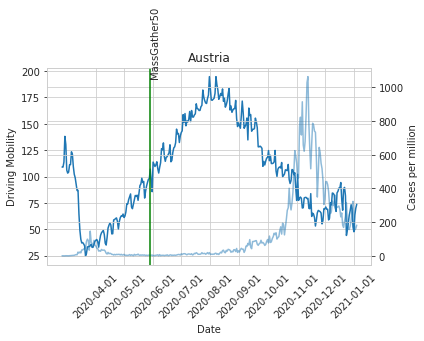

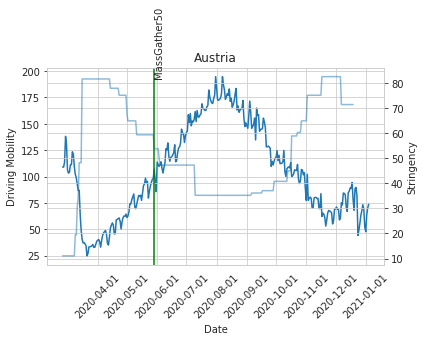

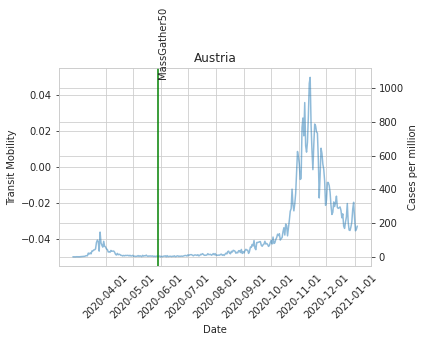

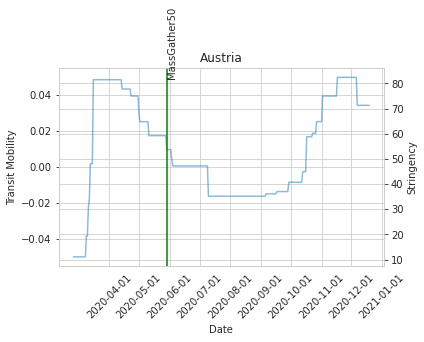

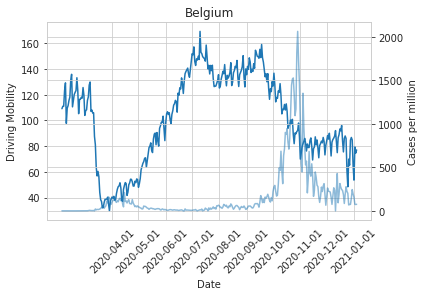

...

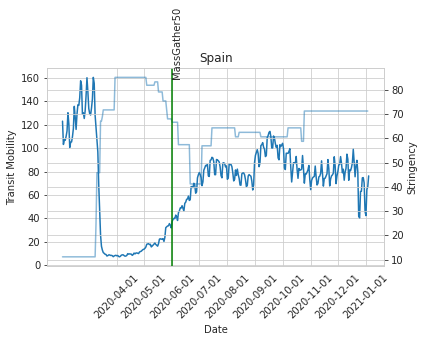

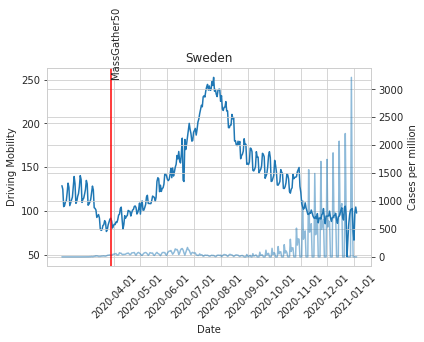

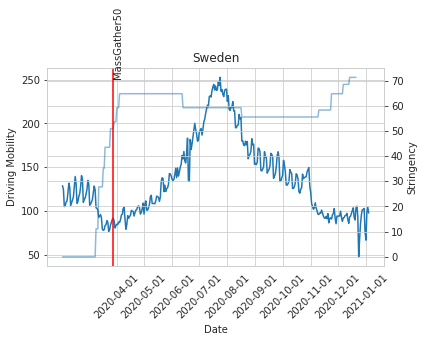

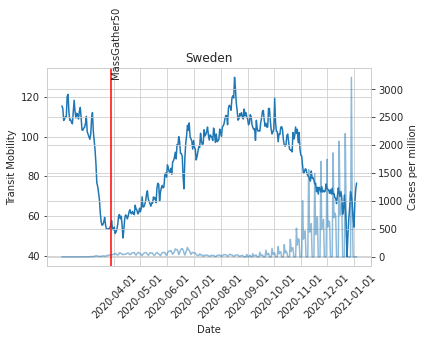

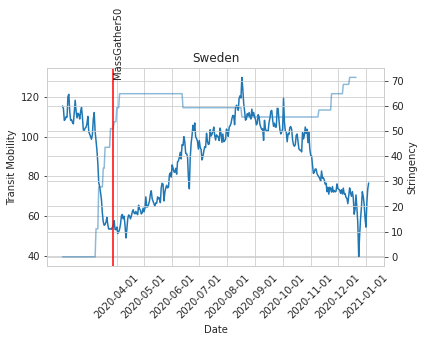

In [11]:
for country in country_list:
    country_df = europe_df[europe_df["location"] == country]
    
    plot_driving_transit_response(country_df, country, "MassGather50")


/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.p

/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.p

/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.p

/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/home/charlotte/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.p

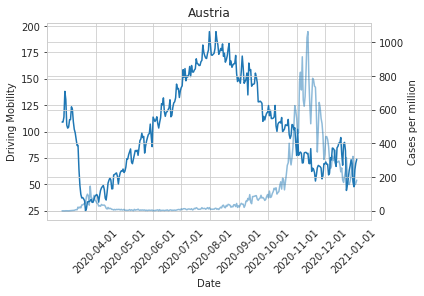

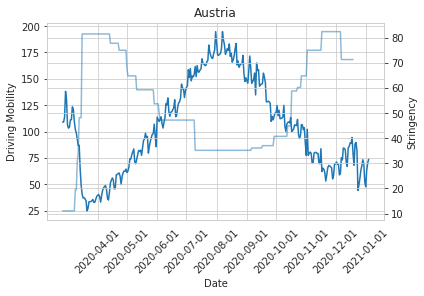

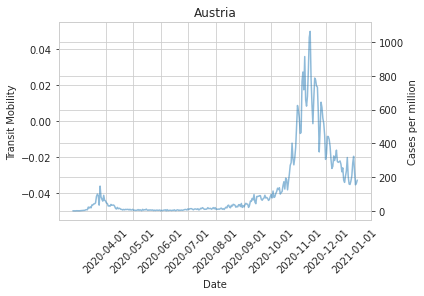

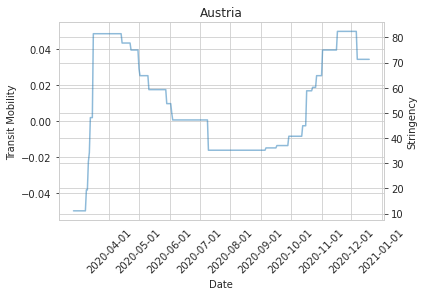

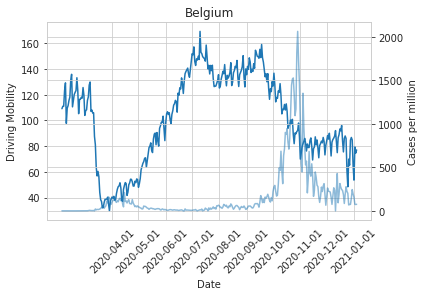

...

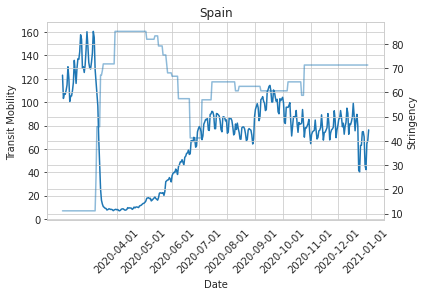

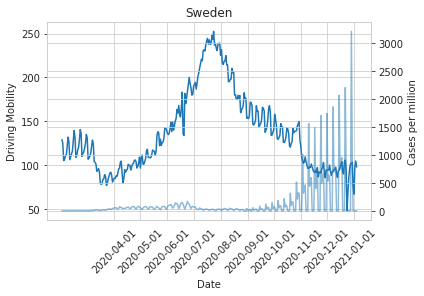

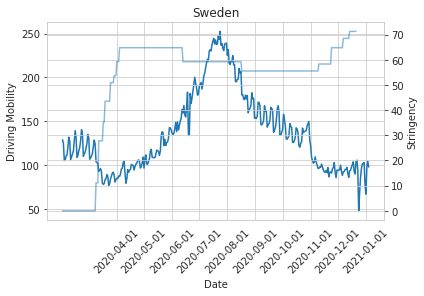

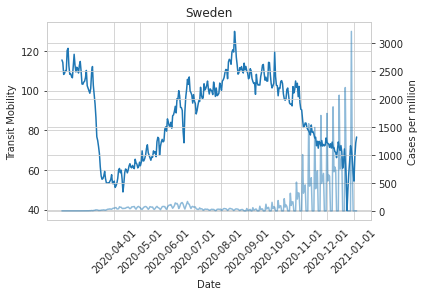

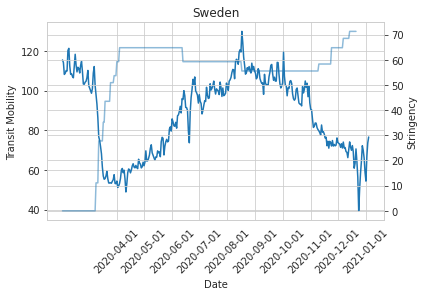

In [14]:
for country in country_list:
    country_df = europe_df[europe_df["location"] == country]
    
    plot_driving_transit_response(country_df, country, "StayHomeOrder")
